In [1]:
from Tusc5ImageUtils import *
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
#%matplotlib inline
from skimage import exposure
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io, plot, models
from scipy.ndimage import binary_erosion, binary_fill_holes, center_of_mass, measurements
import subprocess
import os
import pandas as pd
import nd2

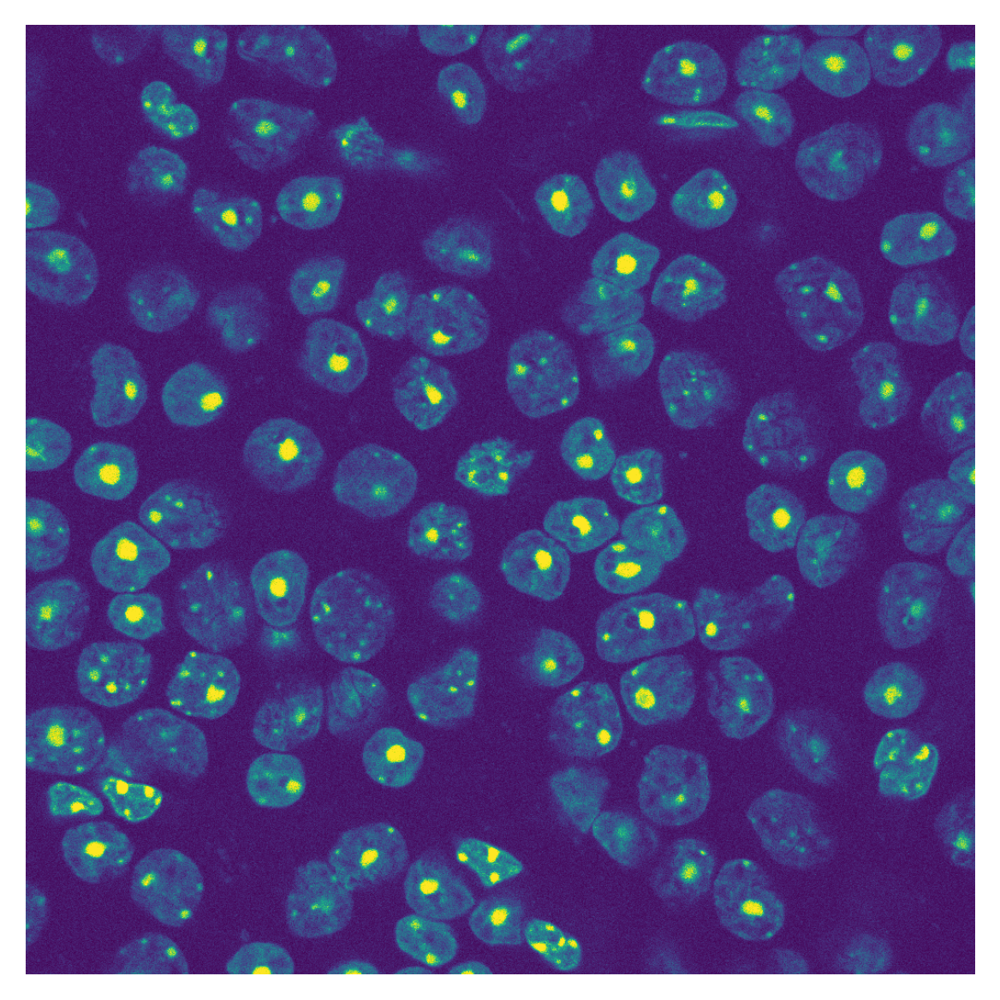

In [2]:
img_path = '/Users/raphaeltinio/Desktop/test stacks/2007R_GLUT1_647_WGA_594_0002.nd2'

f = nd2.ND2File(img_path)

image = f.asarray()

plt.imshow(to_8bit(f.asarray()[36,0]))
plt.axis('off')

DAPI_stack = to_8bit(image[:,0,:,:].copy())
WGA_stack = to_8bit(image[:,2,:,:].copy())
eGFP_stack = to_8bit(image[:,1,:,:].copy())

mp_DAPI = max_proj(DAPI_stack)

model = models.CellposeModel(model_type='T5_DAPI_V1')
masks, flows, styles = model.eval(mp_DAPI, diameter=None, channels=[0,0])

(-0.5, 1023.5, 1023.5, -0.5)

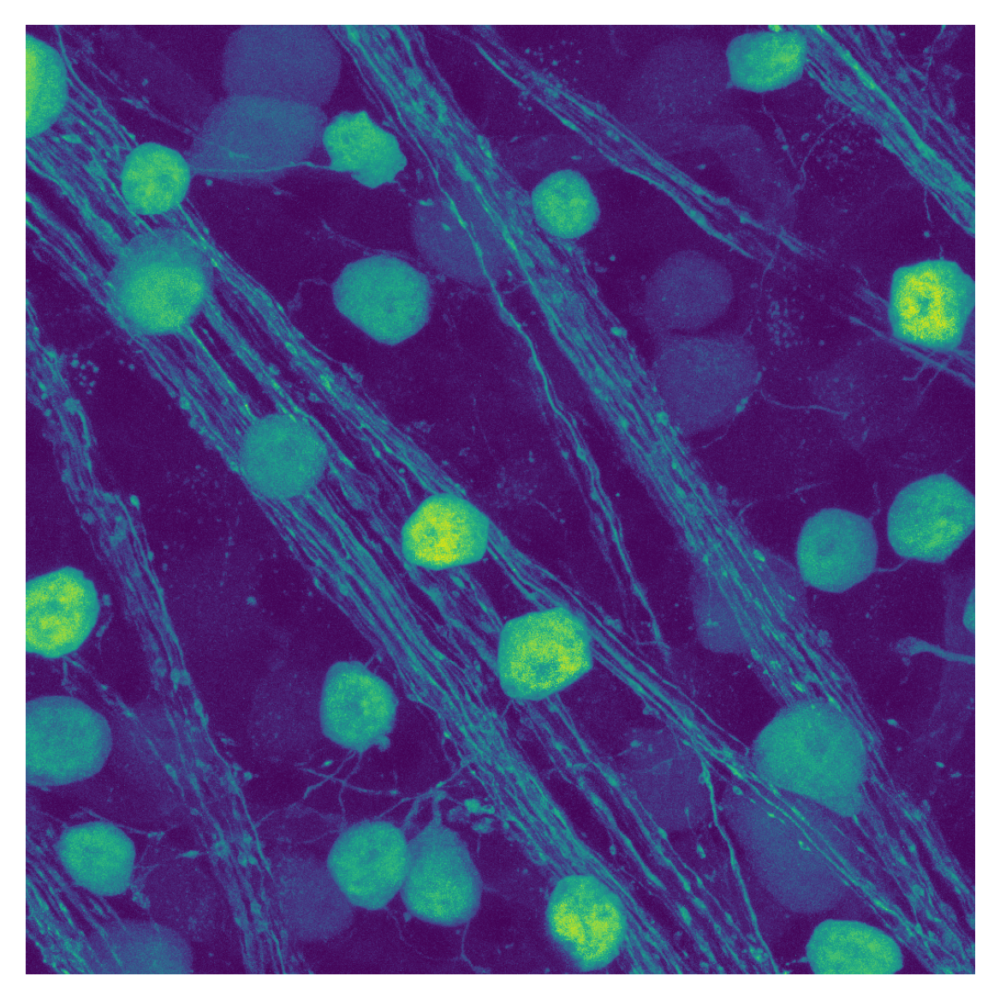

In [3]:
z_avg = int(np.mean(nuclei_slices(DAPI_stack, masks)))

up_and_down = 2.25 // f.voxel_size().z


z_min = int(z_avg - up_and_down)
z_max = int(z_avg + up_and_down)

plt.imshow(auto_brightness_contrast(max_proj(eGFP_stack[z_min : z_max])))
plt.axis('off')

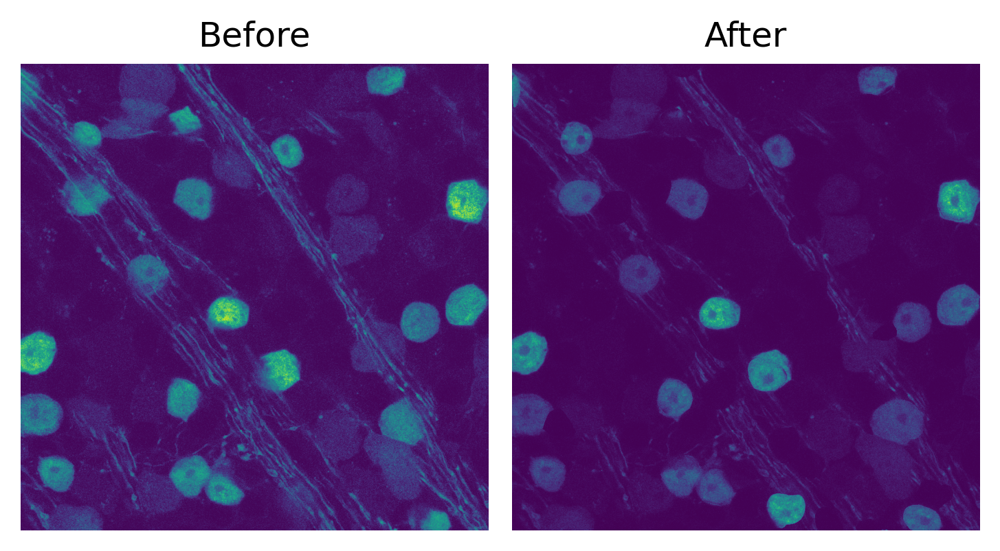

In [4]:
plot1, plot2 = cell_projector(eGFP_stack, masks, nuclei_slices(DAPI_stack, masks))

plot_2images(auto_brightness_contrast(plot1), plot2)

In [5]:
model = models.CellposeModel(model_type='cyto3')
masks_egfp, flows, styles = model.eval(plot1, diameter=None, channels=[0,0])

(-0.5, 1023.5, 1023.5, -0.5)

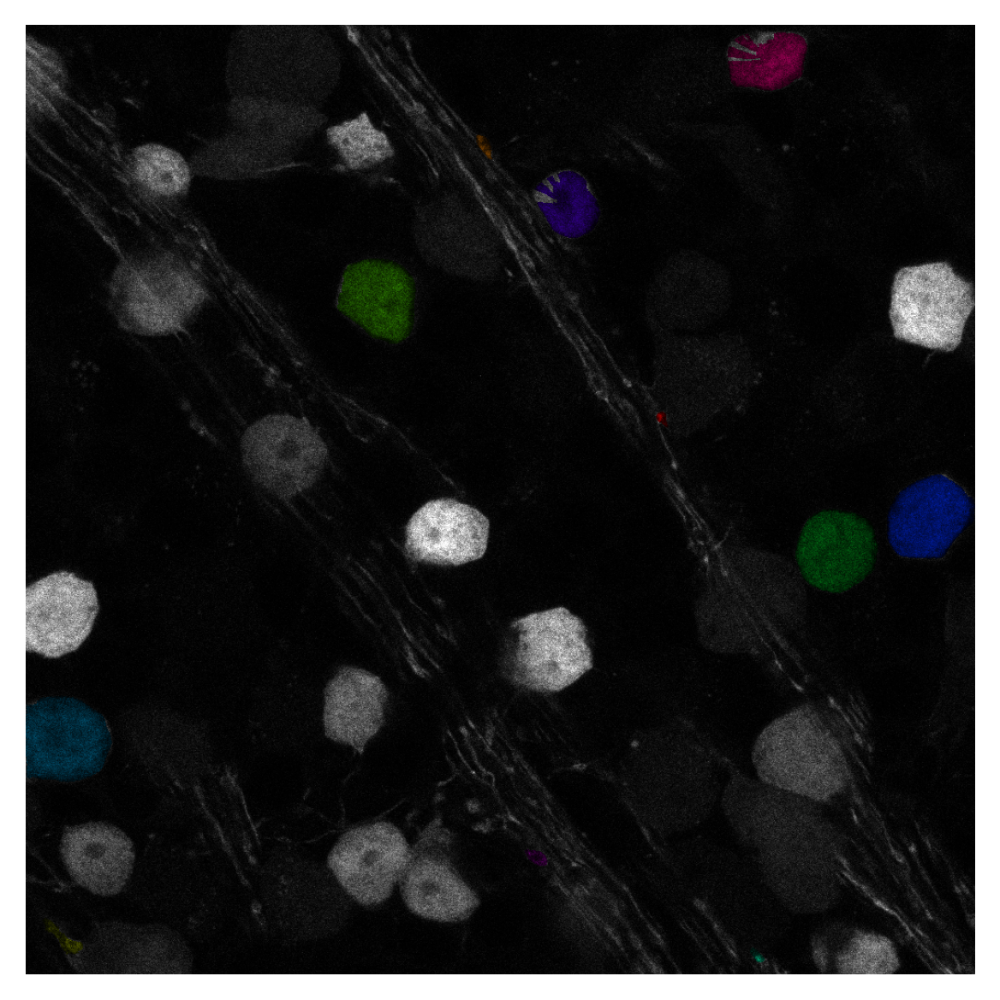

In [6]:
plt.imshow(plot.mask_overlay(eGFP_stack[40], masks_egfp))
plt.axis('off')

In [188]:
def plot_mask_overlap(mask1, mask2, background_value:list = [0,0,0]):
    
    if mask1.shape != mask2.shape:
        raise Exception("Mask shapes do not match")

    height, width = mask1.shape
    base_array1 = np.zeros((height, width, 3), np.uint8)
    base_array2 = np.zeros((height, width, 3), np.uint8)

    base_array1[mask1 != 0] = [0, 0, 255]
    base_array2[mask2 != 0] = [0, 255, 0]

    combined_array = base_array1 + base_array2

    # changing background
    sums = combined_array.sum(axis = -1)
    background_mask = (sums == 0)
    combined_array[background_mask] = background_value

    plt.imshow(combined_array)
    plt.axis('off')

In [18]:
def calculate_overlap_metrics(mask1, mask2):
    if mask1.shape != mask2.shape:
        raise ValueError("Mask shapes do not match")

    # Convert masks to boolean arrays
    mask1 = mask1.astype(bool)
    mask2 = mask2.astype(bool)

    # Calculate intersection and union
    intersection = np.logical_and(mask1, mask2)
    union = np.logical_or(mask1, mask2)

    iou = np.sum(intersection) / np.sum(union)
    dice = 2 * np.sum(intersection) / (np.sum(mask1) + np.sum(mask2))

    return iou, dice

# Example usage:
iou, dice = calculate_overlap_metrics(masks, masks_egfp)
print(f"IoU: {iou}, Dice Coefficient: {dice}")

IoU: 0.04888763516690174, Dice Coefficient: 0.09321805983368774


In [190]:
def plot_maskids(center_of_masses, text_color:str = 'white'):

    if len(center_of_masses[0]) != 2:
        raise ValueError('Function expects 2D or xy points')
    
    for idx, coords in enumerate(center_of_masses):
        plt.annotate(text=str(idx), xy=(coords[1], coords[0]), xytext=(coords[1], coords[0]),
                     color=text_color, fontsize=5, ha='center', va='center')

In [96]:
def extract_masks(total_masks, points, reset_mask_ids=True):
    mod_masks = total_masks.copy()

    # Ensure points is a numpy array
    if isinstance(points, int):
        points = np.array([points])
    else:
        points = np.array(points)

    points = points + 1  # Increment to maintain zero-based indexing

    # Mask to keep only the desired points
    mod_masks[~np.isin(mod_masks, points)] = 0

    if reset_mask_ids:
        unique_values = np.unique(mod_masks)
        unique_values.sort()  # Sort unique values to maintain order
        for new_id, old_id in enumerate(unique_values):
            mod_masks[mod_masks == old_id] = new_id

    return mod_masks

In [30]:
def find_closest_coordinates(target, coordinates, num_closest=4):
    # Calculate the Euclidean distance from the target coordinate to each coordinate in the list
    distances = [np.linalg.norm(np.array(coord) - np.array(target)) for coord in coordinates]
    
    # Get the indices of the sorted distances
    sorted_indices = np.argsort(distances)
    
    # Select the num_closest coordinates
    closest_coords = {idx: coordinates[idx] for idx in sorted_indices[:num_closest]}
    
    return closest_coords

In [25]:
def get_nuclei_position(masks):

    cell_coords = []

    for maski in np.delete(np.unique(masks),0):
        
        single_mask = extract_masks(masks, maski)

        cell_coords.append(center_of_mass(single_mask))

    return cell_coords

In [155]:
eGFP_coords = get_nuclei_position(masks_egfp)
DAPI_coords = get_nuclei_position(masks)

def get_overlapping_masks(channel1_coords, channel2_coords, threshold:int = .40):
    overlapping_pairs = []

    '''
    This function identifies the nearest cell positions in channel 2
    relative to a given cell in channel 1.

    Thus this function will run n = len(primary_coords) times, so automatically deciding
    which channel is considered the primary channel is essential for efficiency.

    Typically channel 1 is DAPI and channel 2 is eGFP
    '''

    if len(channel1_coords) < len(channel2_coords):
        primary_coords = channel1_coords
        secondary_coords = channel2_coords

    else:
        primary_coords = channel2_coords
        secondary_coords = channel1_coords

    for idx_egfp, single_coord in enumerate(primary_coords):
        closest_coords = find_closest_coordinates(single_coord, secondary_coords)
        egfp_maski = extract_masks(masks_egfp, idx_egfp)
        
        for idx_dapi in closest_coords.keys():

            DAPI_maski = extract_masks(masks, idx_dapi)

            iou, dice = calculate_overlap_metrics(egfp_maski, DAPI_maski)

            if iou > threshold or dice > threshold:
                overlapping_pairs.append((idx_egfp, idx_dapi))

    # Code to check for repeats

    for n in range(2):

        counts = np.bincount([i[n] for i in overlapping_pairs])
        repeats = np.nonzero(counts > 1)[0]
    
        if len(repeats) > 0:
            raise Exception(f'''Cells from channel {n} overlapped with more than one cell:
                            \n {repeats}\n Try raising threshold''')
    

    return overlapping_pairs

eGFP_positive_cells = get_overlapping_masks(DAPI_coords, eGFP_coords)

print(f'These cells are eGFP positive: {[i[1] for i in eGFP_positive_cells]}')

These cells are eGFP positive: [8, 28, 41, 66, 72, 99]


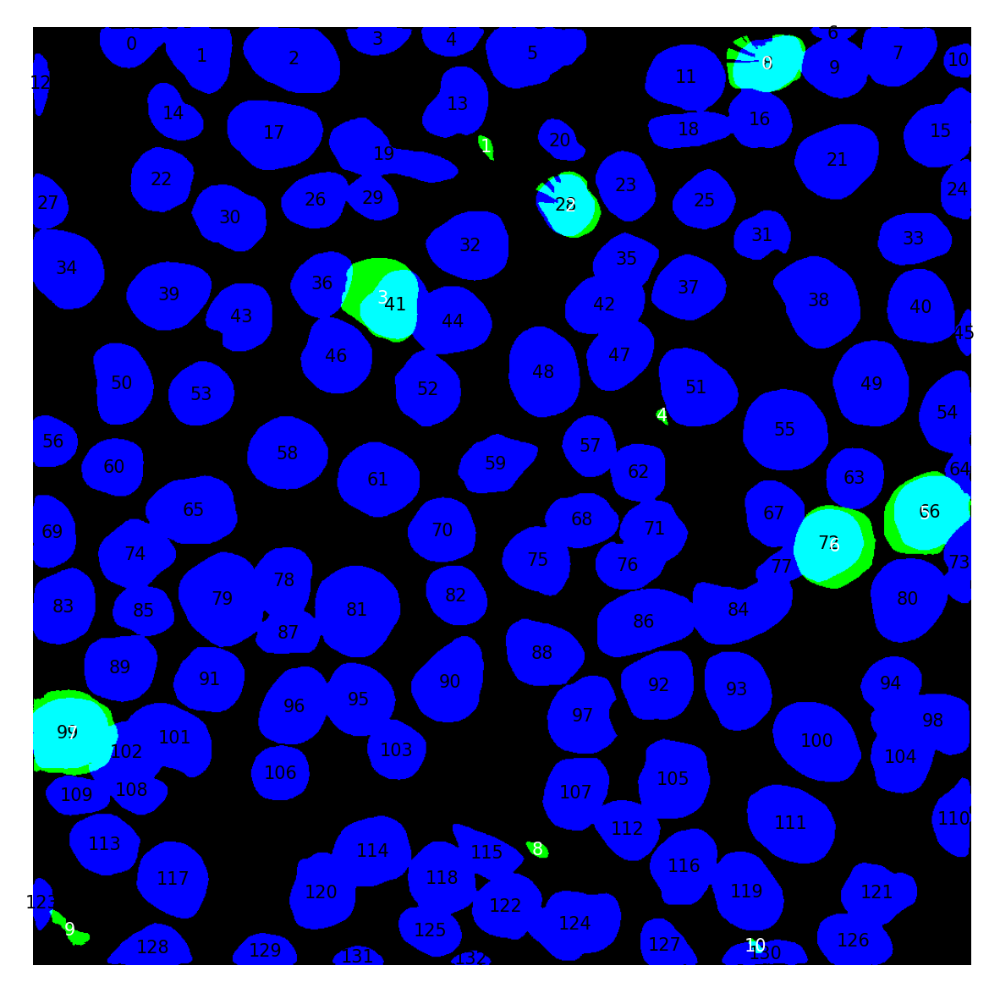

In [141]:
plot_mask_overlap(masks, masks_egfp)
plot_maskids(DAPI_coords, text_color = 'black')
plot_maskids(eGFP_coords, text_color = 'white')

# Finding closest masks

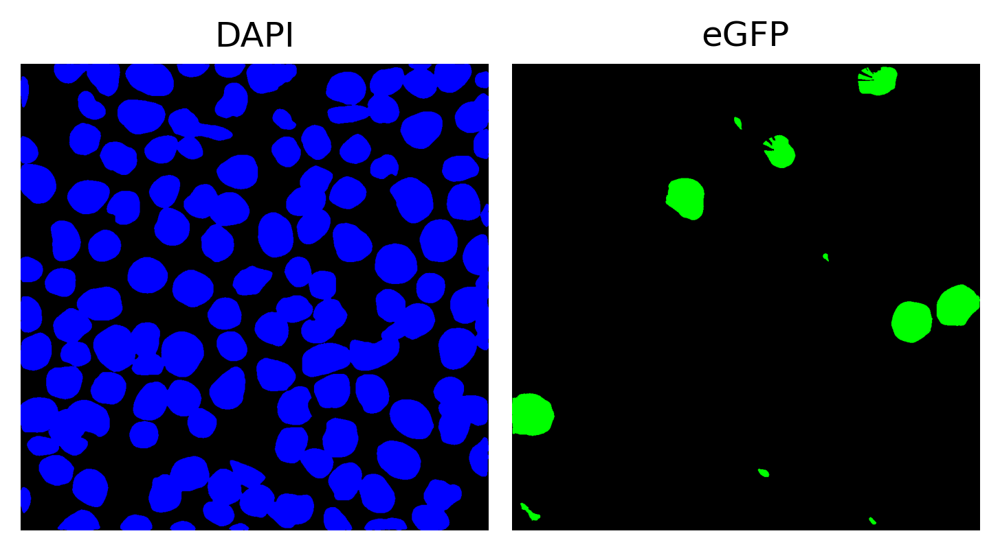

In [160]:
def to_rgb(mask, rgb_value:list = [255,255,255], background_value:list = [0,0,0]):
    height, width = mask.shape
    array_3d = np.zeros((height, width, 3), dtype=np.uint8)
    array_3d[mask != 0] = rgb_value
    array_3d[mask == 0] = background_value

    return array_3d

masks_dapi_color = to_rgb(masks, rgb_value = [0,0,255])
masks_egfp_color = to_rgb(masks_egfp, rgb_value = [0,255,0])
plot_2images(masks_dapi_color, masks_egfp_color, titles = ['DAPI', 'eGFP'])

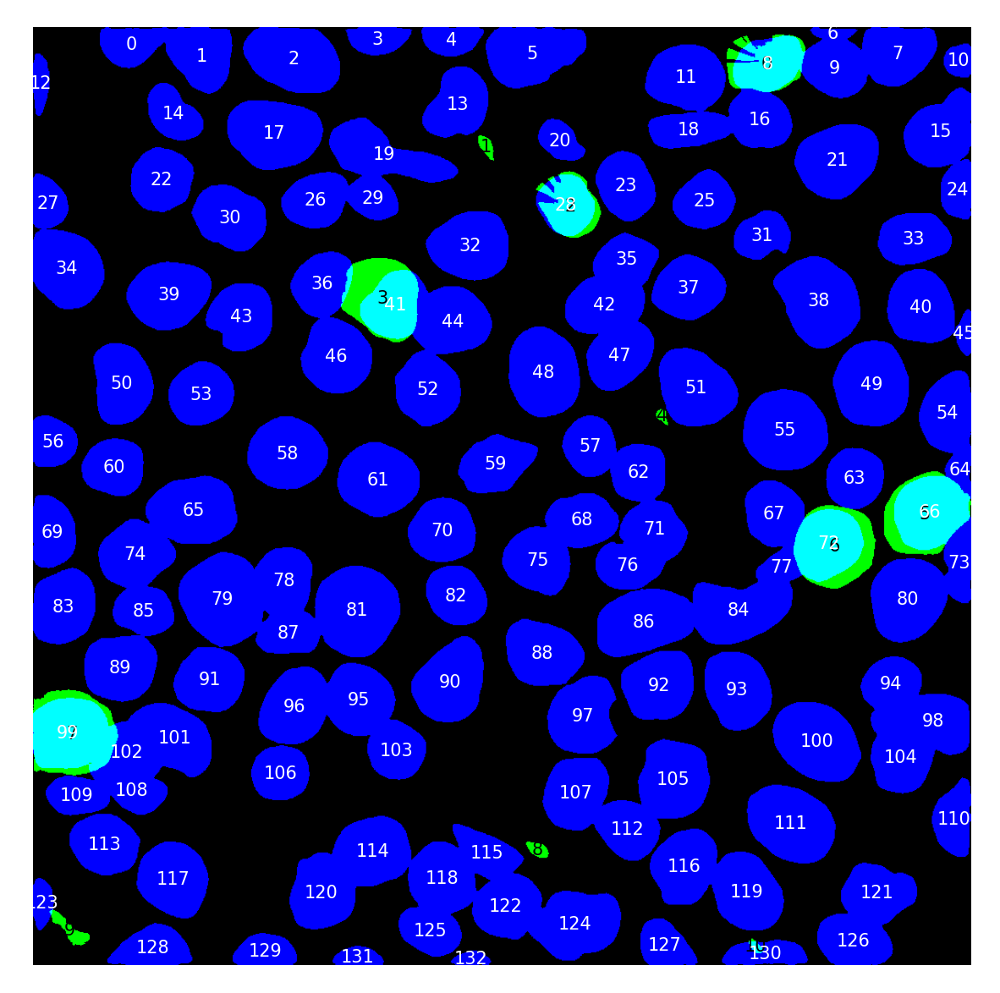

In [187]:
plot_mask_overlap(masks, masks_egfp)
plot_maskids(eGFP_coords, 'black', font_size = 8)
plot_maskids(DAPI_coords, 'white', font_size = 8)